# Run some EDA on the Dataset

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
# Load Data and Process
train = pd.read_csv("data/train.csv")
private_test = pd.read_csv("data/test.csv")

In [3]:
train.columns

Index(['ID_code', 'target', 'var_0', 'var_1', 'var_2', 'var_3', 'var_4',
       'var_5', 'var_6', 'var_7',
       ...
       'var_190', 'var_191', 'var_192', 'var_193', 'var_194', 'var_195',
       'var_196', 'var_197', 'var_198', 'var_199'],
      dtype='object', length=202)

In [4]:
train.head()

,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,train_0,0,8.9255,-6.7863,11.9081,5.0930,11.4607,-9.2834,5.1187,18.6266,...,4.4354,3.9642,3.1364,1.6910,18.5227,-2.3978,7.8784,8.5635,12.7803,-1.0914
1,train_1,0,11.5006,-4.1473,13.8588,5.3890,12.3622,7.0433,5.6208,16.5338,...,7.6421,7.7214,2.5837,10.9516,15.4305,2.0339,8.1267,8.7889,18.3560,1.9518
2,train_2,0,8.6093,-2.7457,12.0805,7.8928,10.5825,-9.0837,6.9427,14.6155,...,2.9057,9.7905,1.6704,1.6858,21.6042,3.1417,-6.5213,8.2675,14.7222,0.3965
3,train_3,0,11.0604,-2.1518,8.9522,7.1957,12.5846,-1.8361,5.8428,14.9250,...,4.4666,4.7433,0.7178,1.4214,23.0347,-1.2706,-2.9275,10.2922,17.9697,-8.9996
4,train_4,0,9.8369,-1.4834,12.8746,6.6375,12.2772,2.4486,5.9405,19.2514,...,-1.4905,9.5214,-0.1508,9.1942,13.2876,-1.5121,3.9267,9.5031,17.9974,-8.8104


## Auto EDA Reports

Let's run a vis on both and see how the data matches up

EDA Using Sweetviz to start as it compares train and test

In [5]:
from pandas_profiling import ProfileReport
import sweetviz

### Sweetviz

In [ ]:
santandar_sweetviz = sweetviz.analyze([train, "Train"], target_feat="target", pairwise_analysis='off')

In [ ]:
santandar_sweetviz.show_html('train_sweetviz_report.html')

In [ ]:
# comparison report
santandar_train_test_compare_report = sweetviz.compare([train, "Train"], [private_test, "Test"],
                                                       "target", pairwise_analysis='off')

In [ ]:
santandar_train_test_compare_report.show_html('train_test_sweetviz_report.html')

the distributions of the data has been standardised between train and test but the number of distinct values are quite different

pandas profiling

### Pandas Profiling

In [ ]:
# take a subset
subset_train = train.sample(n=5000)

In [ ]:
subset_train_profile = train.profile_report(
    html = {
        "inline": False
    },
    missing_diagrams={
          'heatmap': False,
          'dendrogram': False,
      }
)

In [ ]:
subset_train_profile.to_widgets()

In [6]:
lite_profile = ProfileReport(train, minimal=True)

In [8]:
lite_profile.to_notebook_iframe()

### autoviz

In [6]:
from autoviz.AutoViz_Class import AutoViz_Class
AV = AutoViz_Class()

Imported AutoViz_Class version: 0.0.79. Call using:
    from autoviz.AutoViz_Class import AutoViz_Class
    AV = AutoViz_Class()
    AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=0,
                            lowess=False,chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30)
Note: verbose=0 or 1 generates charts and displays them in your local Jupyter notebook.
      verbose=2 saves plots in your local machine under AutoViz_Plots directory and does not display charts.


Shape of your Data Set: (200000, 202)
############## C L A S S I F Y I N G  V A R I A B L E S  ####################
Classifying variables in data set...
    Number of Numeric Columns =  200
    Number of Integer-Categorical Columns =  0
    Number of String-Categorical Columns =  0
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  0
    Number of Numeric-Boolean Columns =  0
    Number of Discrete String Columns =  1
    Number of NLP String Columns =  0
    Number of Date Time Columns =  0
    Number of ID Columns =  0
    Number of Columns to Delete =  0
    201 Predictors classified...
        This does not include the Target column(s)
        1 variables removed since they were ID or low-information variables
    List of variables removed: ['ID_code']
Since Number of Rows in data 200000 exceeds maximum, randomly sampling 150000 rows for EDA...

################### Binary-Class VISUALIZATION Started #####################
Number of variables = 200 

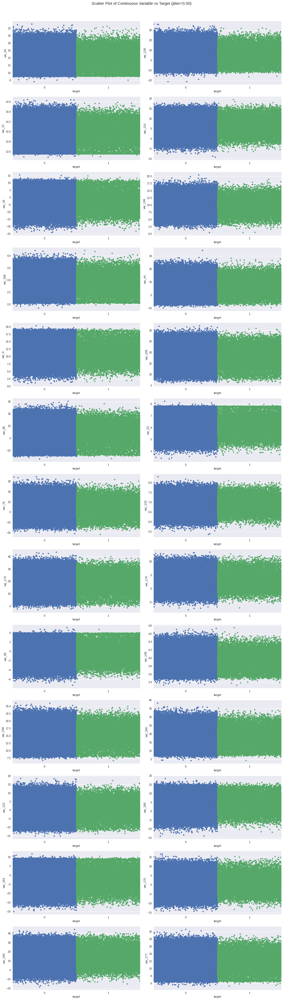

Total Number of Scatter Plots = 351


In [ ]:
sep = ','
dft = AV.AutoViz(filename="",sep=sep, depVar='target', dfte=train, header=0, verbose=1, 
                 lowess=False, chart_format='svg', max_rows_analyzed=150000, max_cols_analyzed=30)

# Target split

In [17]:
from sklearn.neighbors import KernelDensity
from operator import itemgetter

In [16]:
import seaborn as sns

<AxesSubplot:xlabel='var_174', ylabel='Density'>

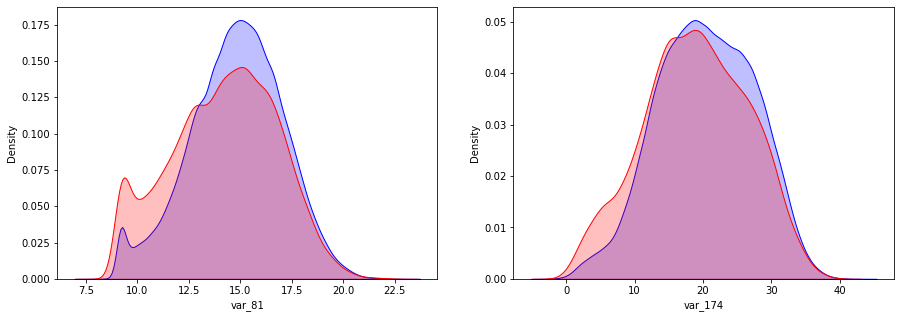

In [29]:
feat1, feat2 = 'var_81', 'var_174'

fig = plt.subplots(figsize=(15, 5))

plt.subplot(1, 2, 1)
sns.kdeplot(train[feat1][train['target'] == 0], shade=True, color="b", label = 'target = 0')
sns.kdeplot(train[feat1][train['target'] == 1], shade=True, color="r", label = 'target = 1')

plt.subplot(1, 2, 2)
sns.kdeplot(train[feat2][train['target'] == 0], shade=True, color="b", label = 'target = 0')
sns.kdeplot(train[feat2][train['target'] == 1], shade=True, color="r", label = 'target = 1')

<AxesSubplot:xlabel='var_76', ylabel='Density'>

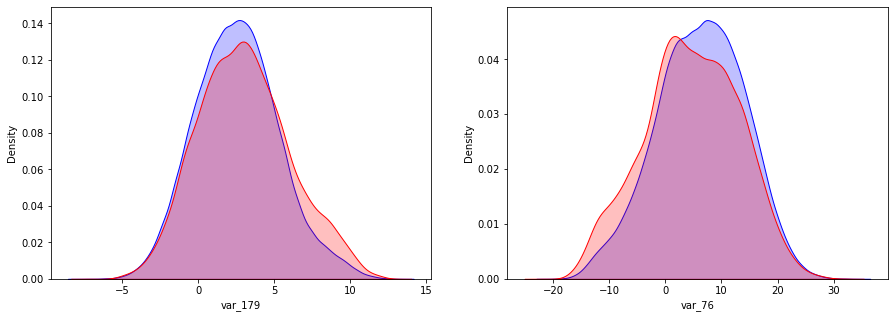

In [31]:
feat1, feat2 = 'var_179', 'var_76'

fig = plt.subplots(figsize=(15, 5))

plt.subplot(1, 2, 1)
sns.kdeplot(train[feat1][train['target'] == 0], shade=True, color="b", label = 'target = 0')
sns.kdeplot(train[feat1][train['target'] == 1], shade=True, color="r", label = 'target = 1')

plt.subplot(1, 2, 2)
sns.kdeplot(train[feat2][train['target'] == 0], shade=True, color="b", label = 'target = 0')
sns.kdeplot(train[feat2][train['target'] == 1], shade=True, color="r", label = 'target = 1')